<a href="https://colab.research.google.com/github/wksiazak/Clinical-Trials---NLP-project/blob/master/NLP_clinical_trails.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Based on Completed 1000 trials from this page https://www.clinicaltrials.gov/search?viewType=Table&limit=100&aggFilters=status:com


In [ ]:
import json
import pandas as pd
import re

In [ ]:
with open('ctg-studies_v3.json', 'r') as f:
    data_loaded = json.load(f)
print(data_loaded)

[{'protocolSection': {'identificationModule': {'nctId': 'NCT06681831', 'orgStudyIdInfo': {'id': '864/16'}, 'organization': {'fullName': 'Fondazione Policlinico Universitario Agostino Gemelli IRCCS', 'class': 'OTHER'}, 'briefTitle': 'Single-Port Hysterectomy (R-SPH) Using the Da Vinci SP System in Low-Risk Endometrial Cancer', 'officialTitle': 'Feasibility, Safety, and Efficacy of Robotic Single-Port Hysterectomy (R-SPH) Using the Da Vinci SP System in Low-Risk Endometrial Cancer: a Pilot Study'}, 'statusModule': {'statusVerifiedDate': '2024-11', 'overallStatus': 'COMPLETED', 'expandedAccessInfo': {'hasExpandedAccess': False}, 'startDateStruct': {'date': '2024-06-26', 'type': 'ACTUAL'}, 'primaryCompletionDateStruct': {'date': '2024-10-01', 'type': 'ACTUAL'}, 'completionDateStruct': {'date': '2024-10-15', 'type': 'ACTUAL'}, 'studyFirstSubmitDate': '2024-11-04', 'studyFirstSubmitQcDate': '2024-11-07', 'studyFirstPostDateStruct': {'date': '2024-11-08', 'type': 'ESTIMATED'}, 'lastUpdateSubm

In [ ]:
df = pd.json_normalize(data_loaded)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 98 columns):
 #   Column                                                                               Non-Null Count  Dtype 
---  ------                                                                               --------------  ----- 
 0   hasResults                                                                           1000 non-null   bool  
 1   protocolSection.identificationModule.nctId                                           1000 non-null   object
 2   protocolSection.identificationModule.orgStudyIdInfo.id                               1000 non-null   object
 3   protocolSection.identificationModule.organization.fullName                           1000 non-null   object
 4   protocolSection.identificationModule.organization.class                              1000 non-null   object
 5   protocolSection.identificationModule.briefTitle                                      1000 non-null

In [ ]:
pd.set_option('display.max_rows', None)
df.isna().sum().sort_values()

,0
hasResults,0
protocolSection.statusModule.lastUpdateSubmitDate,0
protocolSection.statusModule.lastUpdatePostDateStruct.date,0
protocolSection.statusModule.lastUpdatePostDateStruct.type,0
protocolSection.sponsorCollaboratorsModule.responsibleParty.type,0
derivedSection.miscInfoModule.versionHolder,0
protocolSection.eligibilityModule.stdAges,0
protocolSection.statusModule.studyFirstPostDateStruct.type,0
protocolSection.eligibilityModule.sex,0
protocolSection.sponsorCollaboratorsModule.leadSponsor.class,0


Usuwam kolumny z oryginalnego df, gdzie pustych jest więcej niż 990, czyli 6 kolumn

In [ ]:
df = df.loc[:, df.isna().sum() <= 990]

Let's try to shorten names of columns

In [ ]:
# Automatyczne usunięcie prefiksów, takich jak 'protocolSection.'
df.columns = df.columns.str.replace(r'protocolSection\.|resultsSection\.|derivedSection\.', '', regex=True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 92 columns):
 #   Column                                                               Non-Null Count  Dtype 
---  ------                                                               --------------  ----- 
 0   hasResults                                                           1000 non-null   bool  
 1   identificationModule.nctId                                           1000 non-null   object
 2   identificationModule.orgStudyIdInfo.id                               1000 non-null   object
 3   identificationModule.organization.fullName                           1000 non-null   object
 4   identificationModule.organization.class                              1000 non-null   object
 5   identificationModule.briefTitle                                      1000 non-null   object
 6   identificationModule.officialTitle                                   1000 non-null   object
 7   statusModule.sta

In [ ]:
pd.options.display.max_rows = None
pd.options.display.max_colwidth = None

In [ ]:
df.head()

,hasResults,identificationModule.nctId,identificationModule.orgStudyIdInfo.id,identificationModule.organization.fullName,identificationModule.organization.class,identificationModule.briefTitle,identificationModule.officialTitle,statusModule.statusVerifiedDate,statusModule.overallStatus,statusModule.expandedAccessInfo.hasExpandedAccess,...,documentSection.largeDocumentModule.largeDocs,identificationModule.secondaryIdInfos,designModule.designInfo.interventionModelDescription,designModule.designInfo.maskingInfo.maskingDescription,identificationModule.acronym,designModule.bioSpec.retention,designModule.bioSpec.description,outcomesModule.otherOutcomes,referencesModule.seeAlsoLinks,ipdSharingStatementModule.url
0,False,NCT06681831,864/16,Fondazione Policlinico Universitario Agostino Gemelli IRCCS,OTHER,Single-Port Hysterectomy (R-SPH) Using the Da Vinci SP System in Low-Risk Endometrial Cancer,"Feasibility, Safety, and Efficacy of Robotic Single-Port Hysterectomy (R-SPH) Using the Da Vinci SP System in Low-Risk Endometrial Cancer: a Pilot Study",2024-11,COMPLETED,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,False,NCT06681805,36264PR752/7/24,Kafrelsheikh University,OTHER,Prophylactic Mirtazapine and Different Doses of Intrathecal Morphine in Preventing Nausea and Vomiting After Cesarean Section,Role of Prophylactic Mirtazapine and Different Doses of Intrathecal Morphine in Preventing Nausea and Vomiting After Cesarean Section: A Randomized Controlled Trial,2024-11,COMPLETED,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,False,NCT06681727,PD pilot,Region Stockholm,OTHER_GOV,Feasibility of Accessible Video Mental Healthcare Triage and Assessment - A Clinical Pilot Study,Feasibility of Accessible Video Mental Healthcare Triage and Assessment - A Clinical Pilot Study,2024-08,COMPLETED,False,...,"[{'typeAbbrev': 'ICF', 'hasProtocol': False, 'hasSap': False, 'hasIcf': True, 'label': 'Informed Consent Form', 'date': '2022-08-22', 'uploadDate': '2024-08-23T09:45', 'filename': 'ICF_000.pdf', 'size': 171392}]",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,False,NCT06681675,2023/671,Selcuk University,OTHER,The Effect of the Intrapartum Care Model Given in Line With WHO Recommendations on the Birth Process and Care,"The Effect of the Intrapartum Care Model Given in Line With WHO Recommendations on Labor Pain, Fear, Comfort, Duration, Oxytocin Use and Midwifery Care Perception: A Randomized Controlled Trial",2024-11,COMPLETED,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,False,NCT06681597,I-MRER [2023] No. 68,Nanchang University,OTHER,Raspberry Ketone Intake Upregulates Circulating FGF21 and Induces Energy Expenditure in Humans,The Effect of Raspberry Ketone Intake on Plasma FGF21 Levels,2023-11,COMPLETED,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
pd.options.display.max_rows = None
pd.options.display.max_colwidth = None

Sprawdzam, które kolumny mają zagnieżdżone struktury

In [ ]:
# Lista kolumn, które zawierają zagnieżdżone struktury
nested_columns = [col for col in df.columns if df[col].apply(lambda x: isinstance(x, (dict, list))).any()]

print("Kolumny z zagnieżdżonymi danymi:")
for col in nested_columns:
    print(col)

Kolumny z zagnieżdżonymi danymi:
conditionsModule.conditions
conditionsModule.keywords
designModule.phases
armsInterventionsModule.interventions
outcomesModule.primaryOutcomes
eligibilityModule.stdAges
contactsLocationsModule.locations
referencesModule.references
conditionBrowseModule.meshes
conditionBrowseModule.ancestors
conditionBrowseModule.browseLeaves
conditionBrowseModule.browseBranches
designModule.designInfo.maskingInfo.whoMasked
armsInterventionsModule.armGroups
outcomesModule.secondaryOutcomes
ipdSharingStatementModule.infoTypes
interventionBrowseModule.meshes
interventionBrowseModule.ancestors
interventionBrowseModule.browseLeaves
interventionBrowseModule.browseBranches
sponsorCollaboratorsModule.collaborators
contactsLocationsModule.overallOfficials
documentSection.largeDocumentModule.largeDocs
identificationModule.secondaryIdInfos
outcomesModule.otherOutcomes
referencesModule.seeAlsoLinks


Spróbujemy wypłaszczyć dane

In [ ]:
import pandas as pd

def flatten_dataframe(df):
    """
    Funkcja do iteracyjnego spłaszczania kolumn DataFrame, dopóki nie pozostaną żadne zagnieżdżone struktury.
    """
    while True:
        # Sprawdza, które kolumny zawierają zagnieżdżone struktury
        nested_columns = [col for col in df.columns if df[col].apply(lambda x: isinstance(x, (dict, list))).any()]

        # Kończy pętlę, jeśli brak zagnieżdżonych kolumn
        if not nested_columns:
            break

        # Iteracja przez każdą kolumnę do spłaszczenia
        for col in nested_columns:
            # Spłaszcza zagnieżdżoną kolumnę, obsługując NaN, gdzie `pd.json_normalize` pomija te wartości
            expanded_df = pd.json_normalize(df[col].dropna())

            # Dodaje prefiks, aby oznaczyć kolumnę źródłową
            expanded_df.columns = [f"{col}_{subcol}" for subcol in expanded_df.columns]

            # Włączenie nowych kolumn do oryginalnego df, a usunięcie starej kolumny
            df = df.drop(columns=[col]).join(expanded_df, how='left')

    return df

# Użycie funkcji
df_flat_2 = flatten_dataframe(df)
#print(df_flat_2.head())


In [ ]:
# Sprawdzam, czy są jeszcze zagnieżdzone strultury
check_nested_columns = [col for col in df_flat_2.columns if df_flat_2[col].apply(lambda x: isinstance(x, (dict, list))).any()]

print("Kolumny z zagnieżdżonymi danymi:")
for col in check_nested_columns:
    print(col)

Kolumny z zagnieżdżonymi danymi:


In [ ]:
df_flat_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Columns: 2030 entries, hasResults to referencesModule.seeAlsoLinks_26_url
dtypes: bool(1), float64(84), int64(1), object(1944)
memory usage: 15.5+ MB


Otrzymalismy plaski plik z 2027 kolumanami, mozemy to wyeksportować do csv

In [ ]:
df_flat_2.to_csv("overview_columns.csv", index=True)

In [ ]:
df_flat_2.isna().sum().sort_values()

,0
hasResults,0
statusModule.studyFirstPostDateStruct.type,0
statusModule.lastUpdateSubmitDate,0
statusModule.lastUpdatePostDateStruct.date,0
statusModule.lastUpdatePostDateStruct.type,0
sponsorCollaboratorsModule.responsibleParty.type,0
sponsorCollaboratorsModule.leadSponsor.name,0
statusModule.studyFirstPostDateStruct.date,0
sponsorCollaboratorsModule.leadSponsor.class,0
designModule.studyType,0


Spróbujemy zrobić df dla wybranych kolumn tekstowych

In [ ]:
lista_kolumn = pd.read_excel('/content/selected_columns_txt.xls.xlsx')
kolumny_do_wydzielenia = lista_kolumn.iloc[:, 0].tolist()

In [ ]:
df_selected_columns = df_flat_2[kolumny_do_wydzielenia]

In [ ]:
df_selected_columns.head()

,identificationModule.organization.fullName,identificationModule.organization.class,identificationModule.briefTitle,identificationModule.officialTitle,sponsorCollaboratorsModule.responsibleParty.type,sponsorCollaboratorsModule.responsibleParty.investigatorFullName,sponsorCollaboratorsModule.responsibleParty.investigatorTitle,sponsorCollaboratorsModule.responsibleParty.investigatorAffiliation,sponsorCollaboratorsModule.leadSponsor.name,sponsorCollaboratorsModule.leadSponsor.class,...,armsInterventionsModule.armGroups_3_label,armsInterventionsModule.armGroups_3_type,armsInterventionsModule.armGroups_3_description,armsInterventionsModule.armGroups_4_label,armsInterventionsModule.armGroups_4_type,armsInterventionsModule.armGroups_4_description,armsInterventionsModule.armGroups_5_label,armsInterventionsModule.armGroups_5_description,armsInterventionsModule.armGroups_5_type,armsInterventionsModule.armGroups_6_label
0,Fondazione Policlinico Universitario Agostino Gemelli IRCCS,OTHER,Single-Port Hysterectomy (R-SPH) Using the Da Vinci SP System in Low-Risk Endometrial Cancer,"Feasibility, Safety, and Efficacy of Robotic Single-Port Hysterectomy (R-SPH) Using the Da Vinci SP System in Low-Risk Endometrial Cancer: a Pilot Study",PRINCIPAL_INVESTIGATOR,Corrado Giacomo,Principal investigator,Fondazione Policlinico Universitario Agostino Gemelli IRCCS,Fondazione Policlinico Universitario Agostino Gemelli IRCCS,OTHER,...,Groups IV,PLACEBO_COMPARATOR,"Patients received a placebo one hour before surgery plus 10 mg of bupivacaine 0.5%, along with 0.1 mg of morphine.",Placebo,PLACEBO_COMPARATOR,NaN,Group 6: Non-Smokers with severe periodontitis,"Patients with no history of cigarette use were assigned to the non-smoking group. Clinical attachment loss of 1-2 mm was classified as and ≥5 mm as stages III-IV. The criteria for tooth loss included up to four teeth lost for stage III, and five or more teeth lost due to periodontitis for stage IV (severe periodontitis)",NaN,VII
1,Kafrelsheikh University,OTHER,Prophylactic Mirtazapine and Different Doses of Intrathecal Morphine in Preventing Nausea and Vomiting After Cesarean Section,Role of Prophylactic Mirtazapine and Different Doses of Intrathecal Morphine in Preventing Nausea and Vomiting After Cesarean Section: A Randomized Controlled Trial,PRINCIPAL_INVESTIGATOR,Basma Mohamed Ghoniem,"Lecturer of Anesthesiology, Surgical Intensive Care and Pain Medicine, Faculty of Medicine, Kafrelshiekh University, Kafrelshiekh, Egypt",Kafrelsheikh University,Kafrelsheikh University,OTHER,...,YZJ-1139 60mg,EXPERIMENTAL,NaN,sham,SHAM_COMPARATOR,"80% of the individual subjects' active motor threshold (AMT) four times within a 20-minute time frame starting at 0 minutes, 5 minutes, 10 minutes, and 15 minutes from the beginning of the intervention resulting in 2400 delivered pulses for the whole intervention",Group 6 (height 1.5; surgery 2),Placement of a delayed intermediate abutment (in the second implant surgery). This abutment has a height of 1.5 mm.,ACTIVE_COMPARATOR,HDM1005 injection 10.0 mg
2,Region Stockholm,OTHER_GOV,Feasibility of Accessible Video Mental Healthcare Triage and Assessment - A Clinical Pilot Study,Feasibility of Accessible Video Mental Healthcare Triage and Assessment - A Clinical Pilot Study,SPONSOR,NaN,NaN,NaN,Region Stockholm,OTHER_GOV,...,Combined iTBS-tACS trough,ACTIVE_COMPARATOR,"To combine tACS and the iTBS protocol, a customized circuit is developed in-house to phase-lock the TMS pulses to the waveform generated by tACS. TMS pulses were delivered using two figure-of-eight shaped coils (double 70 mm, PMD coil type; Mag and More GmbH, Munich, Germany). For the stimulation, the center of the TMS coils are placed over the two prefrontal tACS electrodes (F3 and F4 electrode positions) with an orientation of 45 degrees to the midline and the handles pointing backward. Using the customized circuit, TMS pulses will be delivered at the trough of the tACS wave.",Group 5: Smokers with severe peri

Czyszczenie tekstu na df z wybranymi kolumnami

In [ ]:
import pandas as pd
import re
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk

# Pobierz stopwords z NLTK (tylko raz)
nltk.download('stopwords')
nltk.download('punkt')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
import re

# Funkcja do czyszczenia tekstu
def clean_text(text):
    if isinstance(text, str):  # Sprawdzenie, czy wartość jest typu string
        text = text.lower()  # Konwersja do małych liter
        text = re.sub(r'\d+', '', text)  # Usunięcie cyfr
        text = re.sub(r'\W+', ' ', text)  # Usunięcie znaków specjalnych
        text = re.sub(r'\s+', ' ', text)  # Usunięcie dodatkowych spacji
        return text.strip()
    return text  # Zwrot oryginalnej wartości, jeśli nie jest typu string

# Zastosowanie clean_text na wszystkich kolumnach typu object
for col in df_selected_columns.select_dtypes(include=['object']).columns:
    df_selected_columns[col] = df_selected_columns[col].apply(clean_text)

<ipython-input-22-fb9c119d083a>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_columns[col] = df_selected_columns[col].apply(clean_text)


In [ ]:
import pandas as pd
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk

# Pobranie zasobów NLTK
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('punkt_tab')

# Definiowanie stopwords dla języka angielskiego
stop_words = set(stopwords.words('english'))

# Funkcja do usuwania stopwords
def remove_stopwords(text):
    if isinstance(text, str):  # Sprawdzenie, czy wartość jest typu string
        tokens = word_tokenize(text)
        filtered_tokens = [word for word in tokens if word.lower() not in stop_words]
        return ' '.join(filtered_tokens)
    return text  # Zwrot oryginalnej wartości, jeśli nie jest typu string

# Załadowanie danych (upewnij się, że df_selected_columns istnieje)
# df_selected_columns = pd.read_csv("twoj_plik.csv")  # Przykładowe wczytanie pliku CSV

# Zastosowanie remove_stopwords na wszystkich kolumnach typu object
for col in df_selected_columns.select_dtypes(include=['object']).columns:
    df_selected_columns[col] = df_selected_columns[col].apply(remove_stopwords)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
<ipython-input-24-b13c6b938ff4>:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_columns[col] = df_selected_columns[col].apply(remove_stopwords)


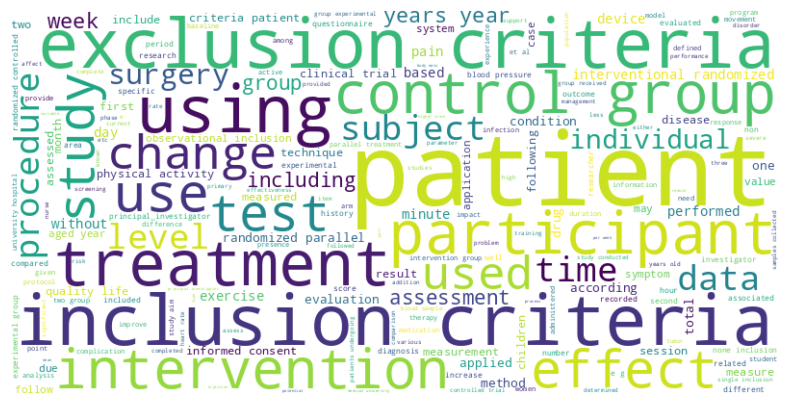

In [ ]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Załadowanie danych do DataFrame
# Zakładamy, że DataFrame `df` zawiera wiele kolumn tekstowych

# 1. Łączenie tekstu z wszystkich kolumn w jeden dokument (jeden ciąg tekstowy)
text = ' '.join(df_selected_columns.apply(lambda row: ' '.join(row.dropna().astype(str)), axis=1))

# 2. Tworzenie chmury słów
wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis', max_words=200).generate(text)

# 3. Wyświetlanie chmury słów
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

Spróbujmy zrobić jeszcze TF-IDF Term Frequency - Inverse Document Frequency

In [ ]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer


# Funkcja do obliczania TF-IDF na kolumnach tekstowych
def compute_tfidf_for_dataframe(df):
    tfidf_results = {}

    for col in df.select_dtypes(include=['object']).columns:
        # Convert boolean values to strings before applying TF-IDF
        df[col] = df[col].astype(str)

        # Inicjalizacja wektoryzera TF-IDF dla bieżącej kolumny
        vectorizer = TfidfVectorizer()

        # Dopasowanie i przekształcenie tekstu z bieżącej kolumny
        tfidf_matrix = vectorizer.fit_transform(df[col].fillna(''))  # Uzupełnienie pustych wartości

        # Konwersja macierzy TF-IDF do DataFrame
        tfidf_df = pd.DataFrame(
            tfidf_matrix.toarray(),
            columns=[f"{col}_{word}" for word in vectorizer.get_feature_names_out()]
        )

        # Dodanie wyniku dla bieżącej kolumny do słownika
        tfidf_results[col] = tfidf_df

    # Połączenie wyników TF-IDF dla wszystkich kolumn w jeden DataFrame
    final_tfidf_df = pd.concat(tfidf_results.values(), axis=1)

    return final_tfidf_df

# Wywołanie funkcji na df_selected_columns
tfidf_df = compute_tfidf_for_dataframe(df_selected_columns)

# Podgląd wyników
#print(tfidf_df.head())

<ipython-input-27-2b5b5ea41eb8>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].astype(str)
<ipython-input-27-2b5b5ea41eb8>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].astype(str)
<ipython-input-27-2b5b5ea41eb8>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

   identificationModule.organization.fullName_aalborg  \
0                                                 0.0   
1                                                 0.0   
2                                                 0.0   
3                                                 0.0   
4                                                 0.0   

   identificationModule.organization.fullName_aarhus  \
0                                                0.0   
1                                                0.0   
2                                                0.0   
3                                                0.0   
4                                                0.0   

   identificationModule.organization.fullName_abant  \
0                                               0.0   
1                                               0.0   
2                                               0.0   
3                                               0.0   
4                                            

In [ ]:
tfidf_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Columns: 108475 entries, identificationModule.organization.fullName_aalborg to armsInterventionsModule.armGroups_6_label_vii
dtypes: float64(108475)
memory usage: 827.6 MB


In [ ]:
from gensim.models import Word2Vec
from nltk.tokenize import word_tokenize
import nltk
nltk.download('punkt')

# Przykład: Konwertujemy każdą kolumnę tekstową w df na listę tokenów
# Na początek łączymy tekst ze wszystkich kolumn, aby mieć pełne zdania lub dokumenty
all_text = df_selected_columns.select_dtypes(include=['object']).apply(
    lambda row: ' '.join(row.dropna().values), axis=1
)

# Tokenizacja - każda linia tekstu staje się listą tokenów (słów)
tokenized_text = all_text.apply(word_tokenize)

# Trening modelu Word2Vec na wszystkich tokenach
# Parametry (np. vector_size, window, min_count) mogą być dopasowane do potrzeb projektu
model = Word2Vec(sentences=tokenized_text, vector_size=100, window=5, min_count=1, workers=4)

# Przykładowy wektor dla danego słowa
print(model.wv['example'])  # Wyświetlenie wektora dla słowa 'example' (jeśli istnieje w słowniku)

# Tworzenie embeddingów dla każdej kolumny w df
def get_embedding(text):
    tokens = word_tokenize(text)
    embeddings = [model.wv[word] for word in tokens if word in model.wv]
    if embeddings:
        # Średnia z embeddingów słów, aby uzyskać reprezentację dla całego tekstu
        return sum(embeddings) / len(embeddings)
    else:
        return None

# Zastosowanie funkcji get_embedding dla każdej kolumny tekstowej
for col in df_selected_columns.select_dtypes(include=['object']).columns:
    df_selected_columns[f'{col}_embedding'] = df_selected_columns[col].apply(
        lambda x: get_embedding(x) if isinstance(x, str) else None
    )

# Wyświetlenie przykładowych embeddingów
print(df_selected_columns[[col for col in df_selected_columns.columns if 'embedding' in col]].head())


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


[-0.26825282  0.06287968  0.09381527 -0.04869303  0.13559835 -0.3870676
  0.45321125  0.36737642  0.09080978 -0.5832034  -0.22392367 -0.79633033
  0.02582173  0.34968308  0.05033467 -0.2045505  -0.35586548 -0.31403503
  0.16894907 -0.23236874  0.09908194  0.3004554  -0.126231   -0.3271976
  0.3722249  -0.19403808 -0.5023765  -0.2587485  -0.5271807  -0.24430402
 -0.03291651  0.1973476  -0.07228468  0.25509283 -0.12293774  0.18280202
  0.12358353 -0.19335906 -0.19408105  0.0174477   0.52539134 -0.2049628
  0.15459807 -0.09880998  0.19511156 -0.26496086 -0.22587062  0.27128208
  0.28554016  0.0304484   0.53221    -0.34033492 -0.29275152 -0.26323658
 -0.26030767  0.04098492  0.42938918  0.28719604 -0.1126256  -0.01579774
 -0.19268319  0.09681784 -0.01553563  0.22980414 -0.3557696   0.06976326
  0.21132651 -0.23789245  0.05604189  0.343128   -0.51996076  0.04426075
  0.4077852  -0.0969089   0.46212232  0.18758203 -0.24338107 -0.6814316
  0.26056382  0.29490274 -0.21760276 -0.11322729  0.196

<ipython-input-31-043ce04b980a>:34: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_selected_columns[f'{col}_embedding'] = df_selected_columns[col].apply(
<ipython-input-31-043ce04b980a>:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_selected_columns[f'{col}_embedding'] = df_selected_columns[col].apply(
<ipython-input-31-043ce04b980a>:34: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns

## NER z biblioteką medyczną

In [ ]:
!pip install transformers
!pip install torch

## posusuwać nany i jeszcze raz sprawdzić wybrane kolumny

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/49.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/213k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/462 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/433M [00:00<?, ?B/s]

Some weights of BertForTokenClassification were not initialized from the model checkpoint at dmis-lab/biobert-v1.1 and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


model.safetensors:   0%|          | 0.00/433M [00:00<?, ?B/s]

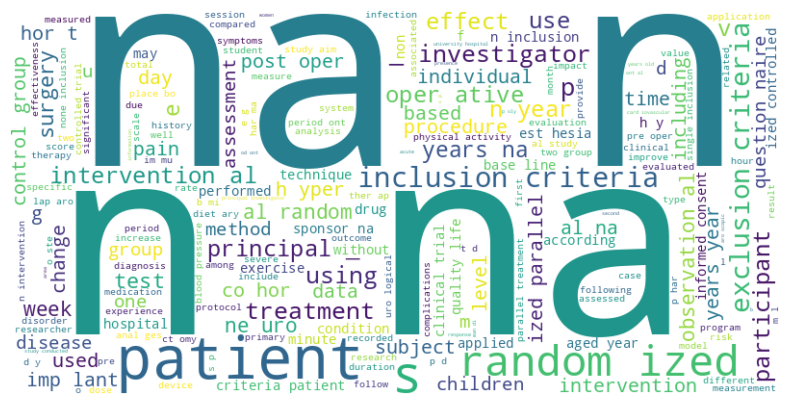

In [ ]:
from transformers import BertTokenizer, BertForTokenClassification
from transformers import pipeline
import torch
import pandas as pd

# Ładowanie modelu BioBERT i tokenizera
tokenizer = BertTokenizer.from_pretrained('dmis-lab/biobert-v1.1')
model = BertForTokenClassification.from_pretrained('dmis-lab/biobert-v1.1')

# Utworzenie pipeline NER
nlp_ner = pipeline("ner", model=model, tokenizer=tokenizer)



# Połączenie tekstu ze wszystkich kolumn w DataFrame
all_text = df_selected_columns.select_dtypes(include=['object']).apply(
    lambda row: ' '.join([str(x) for x in row.dropna().values]), axis=1 # Convert each element to string before joining
)

# Ekstrakcja jednostek medycznych dla każdego wiersza
medical_entities = []
for text in all_text:
    entities = nlp_ner(text)
    medical_entities.extend([ent['word'] for ent in entities])

# Tworzenie tekstu z jednostek medycznych
medical_entities_text = ' '.join(medical_entities)

# Tworzenie Word Cloud
from wordcloud import WordCloud
import matplotlib.pyplot as plt

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(medical_entities_text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

Spróbujmy zrobić chmurę słów z kolumn o tekstach dłuższych niż 10

In [ ]:
# Wyświetlenie najważniejszych słów dla każdej kolumny
for col in df_selected_columns.select_dtypes(include=['object']).columns:
    # Filtrujemy kolumny z tfidf_df dla danego tekstowego atrybutu
    tfidf_col = tfidf_df.filter(regex=f'^{col}_', axis=1)

    # Obliczenie średniej wartości TF-IDF dla każdego słowa, ignorując NaN
    top_words = tfidf_col.mean(skipna=True).sort_values(ascending=False).head(10)

    print(f"Top words in column '{col}':")
    print(top_words)
    print("\n")

Top words in column 'identificationModule.organization.fullName':
identificationModule.organization.fullName_university    0.113999
identificationModule.organization.fullName_hospital      0.047259
identificationModule.organization.fullName_medical       0.031545
identificationModule.organization.fullName_cairo         0.026531
identificationModule.organization.fullName_research      0.017340
identificationModule.organization.fullName_de            0.014219
identificationModule.organization.fullName_institute     0.014033
identificationModule.organization.fullName_national      0.012105
identificationModule.organization.fullName_sciences      0.011707
identificationModule.organization.fullName_mansoura      0.011535
dtype: float64


Top words in column 'identificationModule.organization.class':
identificationModule.organization.class_industry     0.106
identificationModule.organization.class_other_gov    0.048
identificationModule.organization.class_network      0.002
identificationMod

In [ ]:

# Ustalona minimalna długość tekstu, aby uznać go za "dłuższy tekst"
# Sprawdz na średnich długościach kolumn
min_text_length = 10

# Wybór kolumn, które spełniają kryterium długości tekstu
long_text_columns = [col for col in df_flat_2.columns
                     if df_flat_2[col].apply(lambda x: isinstance(x, str) and len(x) > min_text_length).mean() > 0.5]

# Tworzymy nowy DataFrame zawierający tylko kolumny z dłuższym tekstem
df_long_text = df_flat_2[long_text_columns]

print("Wybrane kolumny z dłuższym tekstem:", df_long_text.columns)

Wybrane kolumny z dłuższym tekstem: Index(['identificationModule.organization.fullName',
       'identificationModule.briefTitle', 'identificationModule.officialTitle',
       'sponsorCollaboratorsModule.responsibleParty.type',
       'sponsorCollaboratorsModule.responsibleParty.investigatorFullName',
       'sponsorCollaboratorsModule.responsibleParty.investigatorTitle',
       'sponsorCollaboratorsModule.responsibleParty.investigatorAffiliation',
       'sponsorCollaboratorsModule.leadSponsor.name',
       'descriptionModule.briefSummary',
       'descriptionModule.detailedDescription', 'designModule.studyType',
       'eligibilityModule.eligibilityCriteria',
       'armsInterventionsModule.interventions_0_name',
       'armsInterventionsModule.interventions_0_description',
       'outcomesModule.primaryOutcomes_0_measure',
       'outcomesModule.primaryOutcomes_0_description',
       'outcomesModule.primaryOutcomes_0_timeFrame',
       'contactsLocationsModule.locations_0_facility',

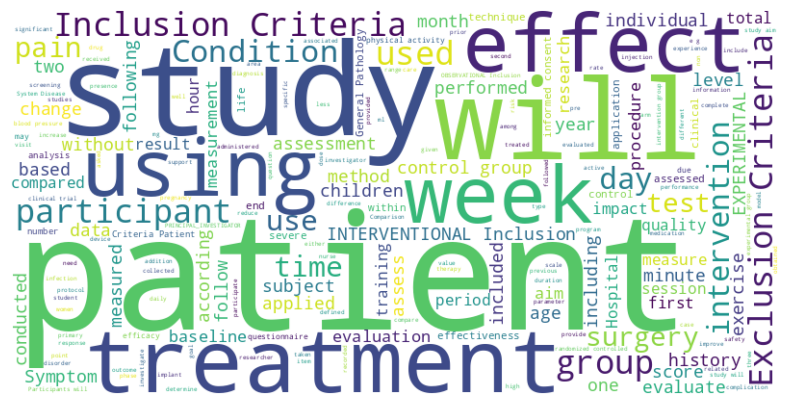

In [ ]:
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Załadowanie danych do DataFrame
# Zakładamy, że DataFrame `df` zawiera wiele kolumn tekstowych

# 1. Łączenie tekstu z wszystkich kolumn w jeden dokument (jeden ciąg tekstowy)
text = ' '.join(df_long_text.apply(lambda row: ' '.join(row.dropna().astype(str)), axis=1))

# 2. Tworzenie chmury słów
wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis', max_words=200).generate(text)

# 3. Wyświetlanie chmury słów
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

## Named Entity Recognition

In [ ]:
import pandas as pd
import spacy

# Załaduj model językowy
nlp = spacy.load("en_core_web_sm")

# Przykład - zakładamy, że `df` to DataFrame z wieloma kolumnami tekstowymi
# Sklejamy wszystkie teksty w jedną listę
texts = df_long_text.apply(lambda row: ' '.join(row.dropna().astype(str)), axis=1)

# Pętla do przeprowadzania NER na każdej frazie tekstowej
all_entities = []
for i, doc in enumerate(nlp.pipe(texts, disable=["tagger", "parser"])):  # pipe przyspiesza przetwarzanie dużych danych
    for ent in doc.ents:
        all_entities.append([i, ent.text, ent.label_])  # dodaj indeks dokumentu

# Konwertowanie wyników do DataFrame, aby wyświetlić je bardziej przejrzyście
entities_df = pd.DataFrame(all_entities, columns=["Document_Index", "Entity", "Label"])
print(entities_df.head())

/usr/local/lib/python3.10/dist-packages/spacy/pipeline/lemmatizer.py:211: UserWarning: [W108] The rule-based lemmatizer did not find POS annotation for one or more tokens. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
  warnings.warn(Warnings.W108)


   Document_Index                                        Entity   Label
0               0  Efficacy of Robotic Single-Port Hysterectomy     ORG
1               0                     Corrado Giacomo Principal  PERSON
2               0                        Fondazione Policlinico  PERSON
3               0                                          FIGO     ORG
4               0                                            IA     GPE


In [ ]:
entity_counts = entities_df['Label'].value_counts()
print(entity_counts)

Label
ORG            16727
CARDINAL       11602
DATE            7342
PERSON          4589
GPE             2685
TIME            1810
PERCENT         1064
ORDINAL         1008
QUANTITY         970
FAC              907
NORP             896
WORK_OF_ART      805
PRODUCT          576
LOC              209
MONEY            109
LAW               97
EVENT             74
LANGUAGE          50
Name: count, dtype: int64


In [ ]:
import pandas as pd

# Przyjmujemy, że masz już DataFrame `df` z danymi tekstowymi

# Obliczanie średniej długości tekstu dla poszczególnych kolumn
average_text_length = {}

for col in df_long_text.columns:
    # Filtruje tylko wartości tekstowe, ignorując np. wartości numeryczne i braki danych (NaN)
    text_data = df_long_text[col].dropna().apply(lambda x: len(str(x)) if isinstance(x, str) else 0)
    average_text_length[col] = text_data.mean()  # Oblicza średnią długość tekstu

# Sortowanie słownika według średniej długości tekstu malejąco
sorted_avg_text_length = dict(sorted(average_text_length.items(), key=lambda item: item[1], reverse=True))

# Wyprintowanie posortowanych wyników
for col, avg_len in sorted_avg_text_length.items():
    print(f"Średnia długość tekstu dla kolumny '{col}': {avg_len:.2f}")



Średnia długość tekstu dla kolumny 'descriptionModule.detailedDescription': 2157.52
Średnia długość tekstu dla kolumny 'eligibilityModule.eligibilityCriteria': 759.03
Średnia długość tekstu dla kolumny 'descriptionModule.briefSummary': 695.42
Średnia długość tekstu dla kolumny 'armsInterventionsModule.interventions_0_description': 285.22
Średnia długość tekstu dla kolumny 'outcomesModule.primaryOutcomes_0_description': 279.34
Średnia długość tekstu dla kolumny 'outcomesModule.secondaryOutcomes_0_description': 237.07
Średnia długość tekstu dla kolumny 'armsInterventionsModule.armGroups_0_description': 227.34
Średnia długość tekstu dla kolumny 'armsInterventionsModule.armGroups_1_description': 189.58
Średnia długość tekstu dla kolumny 'identificationModule.officialTitle': 133.27
Średnia długość tekstu dla kolumny 'identificationModule.briefTitle': 92.88
Średnia długość tekstu dla kolumny 'outcomesModule.primaryOutcomes_0_timeFrame': 44.08
Średnia długość tekstu dla kolumny 'outcomesModul

Jeszcze raz zrobię Word of Cloud z kolumnami gdzie srednia dlugisc tekstu > 50  

In [ ]:
import pandas as pd

# Zakładamy, że masz już załadowany DataFrame `df_flat_2`
# df_flat_2 = pd.read_csv('twoj_plik.csv')  # Przykład wczytania danych

# Krok 1: Wykluczenie kolumn o typach danych bool i datetime
excluded_types = ['bool', 'datetime64[ns]', 'datetime64[ns, UTC]']

# Wybieramy kolumny, które są typu object lub string, ale nie są typu bool ani datetime
text_columns = df_long_text.select_dtypes(include=['object', 'string']).columns.tolist()

# Wykluczamy kolumny, które są typu bool lub datetime
filtered_text_columns = [
    col for col in text_columns
    if not pd.api.types.is_bool_dtype(df_long_text[col]) and not pd.api.types.is_datetime64_any_dtype(df_long_text[col])
]

# Krok 2: Obliczenie średniej długości tekstu dla każdej z wybranych kolumn
average_text_length = {}

for col in filtered_text_columns:
    # Filtrujemy tylko wartości tekstowe, ignorując NaN i inne typy danych
    text_data = df_long_text[col].dropna().apply(lambda x: len(str(x)) if isinstance(x, str) else 0)
    avg_len = text_data.mean()
    average_text_length[col] = avg_len

# Krok 3: Konwersja wyników do Series i filtrowanie na podstawie progu średniej długości
min_avg_length = 25  # Ustal minimalny próg średniej długości tekstu

avg_text_length_series = pd.Series(average_text_length)

# Filtrowanie kolumn, których średnia długość tekstu jest większa niż min_avg_length
filtered_columns = avg_text_length_series[avg_text_length_series > min_avg_length]

# Krok 4: Sortowanie wyników od największej do najmniejszej średniej długości tekstu
sorted_filtered_columns = filtered_columns.sort_values(ascending=False)

# Wyprintowanie posortowanych wyników
print("Kolumny z dłuższym tekstem (posortowane od największej do najmniejszej średniej długości):")
for col, avg_len in sorted_filtered_columns.items():
    print(f"- {col}: średnia długość = {avg_len:.2f} znaków")

# Krok 5: Utworzenie nowego DataFrame z przefiltrowanymi i posortowanymi kolumnami
filtered_df = df_long_text[sorted_filtered_columns.index]

# Wyświetlenie pierwszych kilku wierszy nowego DataFrame
#print("\nNowy DataFrame z przefiltrowanymi kolumnami:")
#print(filtered_df.head())


Kolumny z dłuższym tekstem (posortowane od największej do najmniejszej średniej długości):
- descriptionModule.detailedDescription: średnia długość = 2157.52 znaków
- eligibilityModule.eligibilityCriteria: średnia długość = 759.03 znaków
- descriptionModule.briefSummary: średnia długość = 695.42 znaków
- armsInterventionsModule.interventions_0_description: średnia długość = 285.22 znaków
- outcomesModule.primaryOutcomes_0_description: średnia długość = 279.34 znaków
- outcomesModule.secondaryOutcomes_0_description: średnia długość = 237.07 znaków
- armsInterventionsModule.armGroups_0_description: średnia długość = 227.34 znaków
- armsInterventionsModule.armGroups_1_description: średnia długość = 189.58 znaków
- identificationModule.officialTitle: średnia długość = 133.27 znaków
- identificationModule.briefTitle: średnia długość = 92.88 znaków
- outcomesModule.primaryOutcomes_0_timeFrame: średnia długość = 44.08 znaków
- outcomesModule.primaryOutcomes_0_measure: średnia długość = 42.61 

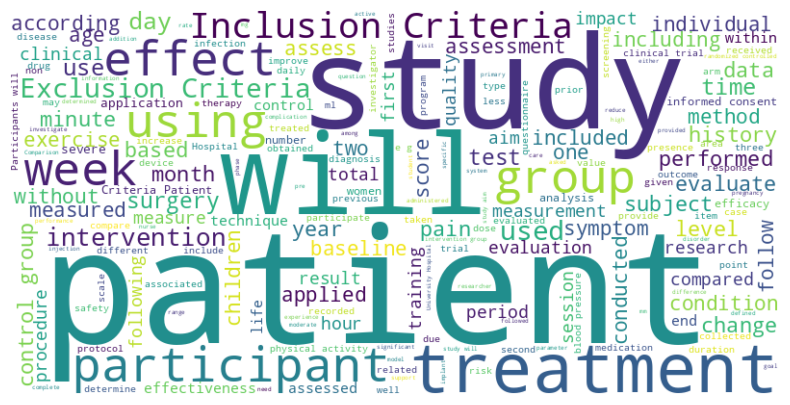

In [ ]:
text = ' '.join(filtered_df.apply(lambda row: ' '.join(row.dropna().astype(str)), axis=1))

# 2. Tworzenie chmury słów
wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis', max_words=200).generate(text)

# 3. Wyświetlanie chmury słów
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [ ]:
import pandas as pd
from textblob import TextBlob

# Zakładamy, że `df` to Twój DataFrame z kilkudziesięcioma kolumnami
# Wybierzmy tylko kolumny tekstowe
text_columns = filtered_df.select_dtypes(include=['object', 'string']).columns

# Utwórz nowy DataFrame do przechowywania wyników analizy sentymentu
sentiment_results = pd.DataFrame(index=filtered_df.index)

# Analiza sentymentu dla każdej kolumny tekstowej
for col in text_columns:
    # Sprawdzamy, czy kolumna zawiera tekst, a następnie obliczamy sentyment
    sentiment_results[f'{col}_sentiment'] = filtered_df[col].dropna().apply(lambda x: TextBlob(str(x)).sentiment.polarity if isinstance(x, str) else 0)
    sentiment_results[f'{col}_sentiment_category'] = sentiment_results[f'{col}_sentiment'].apply(lambda x: 'positive' if x > 0 else ('negative' if x < 0 else 'neutral'))

# Wyświetl pierwsze kilka wierszy wyników analizy sentymentu
#print(sentiment_results.head())

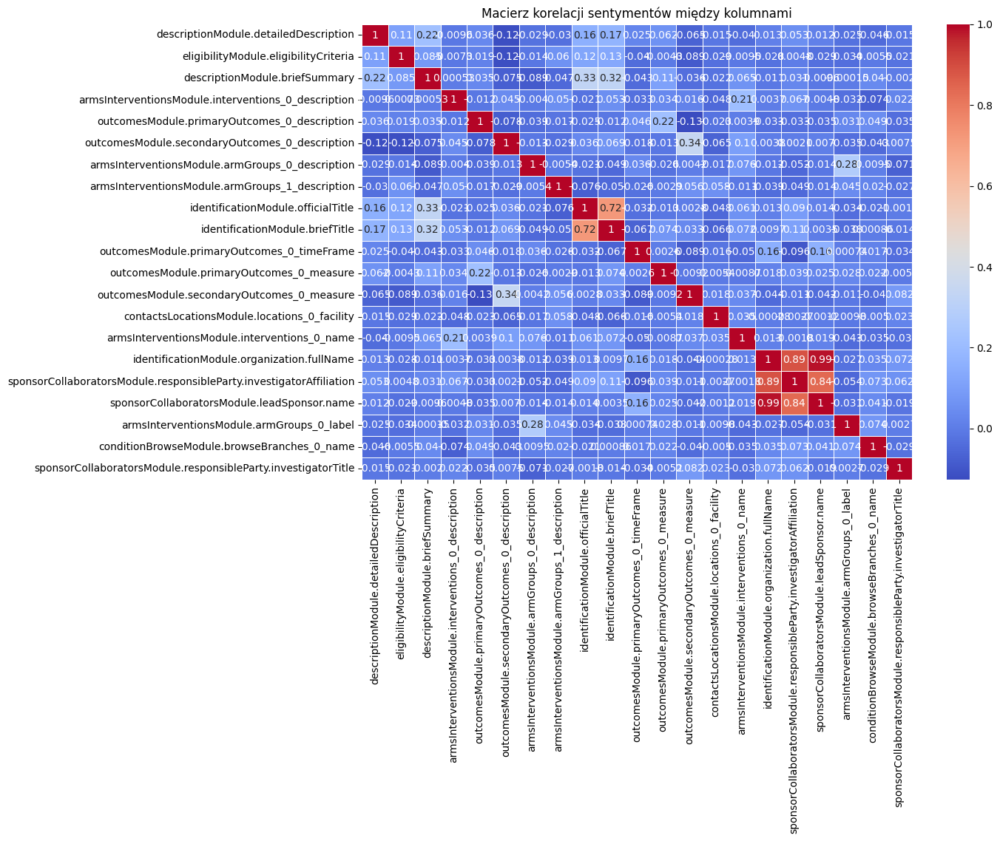

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Zakładamy, że już przeprowadzono analizę sentymentu i wyniki są w sentiment_results

# Wybieramy kolumny, które zawierają wyniki sentymentu dla różnych kolumn z df_filtered
# Będą to kolumny typu <col>_sentiment
sentiment_columns = [f'{col}_sentiment' for col in filtered_df.select_dtypes(include=['object', 'string']).columns]

# Tworzymy DataFrame z wynikami sentymentów (jeśli jeszcze tego nie zrobiono)
sentiment_scores = pd.DataFrame({col: sentiment_results[f'{col}_sentiment'] for col in filtered_df.select_dtypes(include=['object', 'string']).columns})

# Obliczamy korelację między wynikami sentymentów
correlation_matrix = sentiment_scores.corr()

# Rysowanie mapy ciepła (heatmap)
plt.figure(figsize=(12, 8))  # Ustalamy rozmiar wykresu
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Macierz korelacji sentymentów między kolumnami')
plt.show()


## Named entity recognition na pełnym pliku rozpłaszczoym

In [ ]:
df_flat_2.head()

,identificationModule.organization.fullName,identificationModule.organization.class,identificationModule.briefTitle,identificationModule.officialTitle,statusModule.statusVerifiedDate,statusModule.overallStatus,statusModule.expandedAccessInfo.hasExpandedAccess,statusModule.startDateStruct.date,statusModule.startDateStruct.type,statusModule.primaryCompletionDateStruct.date,...,referencesModule.seeAlsoLinks_22_label,referencesModule.seeAlsoLinks_22_url,referencesModule.seeAlsoLinks_23_label,referencesModule.seeAlsoLinks_23_url,referencesModule.seeAlsoLinks_24_label,referencesModule.seeAlsoLinks_24_url,referencesModule.seeAlsoLinks_25_label,referencesModule.seeAlsoLinks_25_url,referencesModule.seeAlsoLinks_26_label,referencesModule.seeAlsoLinks_26_url
0,Fondazione Policlinico Universitario Agostino ...,OTHER,Single-Port Hysterectomy (R-SPH) Using the Da ...,"Feasibility, Safety, and Efficacy of Robotic S...",2024-11,COMPLETED,False,2024-06-26,ACTUAL,2024-10-01,...,Related Info,https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4...,Related Info,https://pubmed.ncbi.nlm.nih.gov/6507532/,Related Info,https://pubmed.ncbi.nlm.nih.gov/1630743/,Related Info,https://pubmed.ncbi.nlm.nih.gov/9917943/,Related Info,https://pubmed.ncbi.nlm.nih.gov/8912990/
1,Kafrelsheikh University,OTHER,Prophylactic Mirtazapine and Different Doses o...,Role of Prophylactic Mirtazapine and Different...,2024-11,COMPLETED,False,2023-01-01,ACTUAL,2024-09-25,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Region Stockholm,OTHER_GOV,Feasibility of Accessible Video Mental Healthc...,Feasibility of Accessible Video Mental Healthc...,2024-08,COMPLETED,False,2022-12-01,ACTUAL,2023-06-30,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Selcuk University,OTHER,The Effect of the Intrapartum Care Model Given...,The Effect of the Intrapartum Care Model Given...,2024-11,COMPLETED,False,2023-09-01,ACTUAL,2023-12-01,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Nanchang University,OTHER,Raspberry Ketone Intake Upregulates Circulatin...,The Effect of Raspberry Ketone Intake on Plasm...,2023-11,COMPLETED,False,2024-01-10,ACTUAL,2024-05-15,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
import pandas as pd
import spacy

# Załaduj model językowy
nlp = spacy.load("en_core_web_sm")

# Przykład - zakładamy, że `df` to DataFrame z wieloma kolumnami tekstowymi
# Sklejamy wszystkie teksty w jedną listę
texts = df_flat_2.apply(lambda row: ' '.join(row.dropna().astype(str)), axis=1)

# Pętla do przeprowadzania NER na każdej frazie tekstowej
all_entities = []
for i, doc in enumerate(nlp.pipe(texts, disable=["tagger", "parser"])):  # pipe przyspiesza przetwarzanie dużych danych
    for ent in doc.ents:
        all_entities.append([i, ent.text, ent.label_])  # dodaj indeks dokumentu

# Konwertowanie wyników do DataFrame, aby wyświetlić je bardziej przejrzyście
entities_df_all = pd.DataFrame(all_entities, columns=["Document_Index", "Entity", "Label"])
print(entities_df_all.head())

/usr/local/lib/python3.10/dist-packages/spacy/pipeline/lemmatizer.py:211: UserWarning: [W108] The rule-based lemmatizer did not find POS annotation for one or more tokens. Check that your pipeline includes components that assign token.pos, typically 'tagger'+'attribute_ruler' or 'morphologizer'.
  warnings.warn(Warnings.W108)


   Document_Index                                        Entity Label
0               0  Efficacy of Robotic Single-Port Hysterectomy   ORG
1               0                                       2024-11  DATE
2               0                                    2024-06-26  DATE
3               0                                    2024-10-01  DATE
4               0                                    2024-10-15  DATE


In [ ]:
entity_counts = entities_df_all['Label'].value_counts()
print(entity_counts)

Label
ORG            27645
DATE           24234
CARDINAL       21309
PERSON         15713
GPE             6027
TIME            3280
NORP            1669
ORDINAL         1430
PERCENT         1381
QUANTITY        1369
WORK_OF_ART     1075
FAC             1069
PRODUCT         1017
LOC              346
MONEY            206
LAW              198
EVENT            184
LANGUAGE          66
Name: count, dtype: int64


In [ ]:
import pandas as pd
from collections import Counter
import spacy

# Załaduj model spaCy
nlp = spacy.load("en_core_web_sm")  # użyj modelu dla języka polskiego; zmień na odpowiedni model dla innych języków

# Przekształć teksty jednostek do podstawowych form i zbierz najczęstsze słowa
def get_most_common_word(texts):
    tokens = []
    for doc in nlp.pipe(texts, disable=["ner"]):  # szybkie przetwarzanie zbiorowe bez rozpoznawania jednostek
        tokens.extend([token.lemma_ for token in doc if token.is_alpha and not token.is_stop])  # lematyzacja, usuwanie stopwords
    most_common_word = Counter(tokens).most_common(1)
    return most_common_word[0][0] if most_common_word else None

# Policz występowania poszczególnych etykiet
entity_counts = entities_df_all['Label'].value_counts()

# Znajdź najczęściej występujące słowo w każdej kategorii NER z tokenizacją i lematyzacją
most_common_words = {}
for label in entity_counts.index:
    # Wybierz wszystkie teksty dla danej etykiety
    words = entities_df_all[entities_df_all['Label'] == label]['Entity']
    most_common_words[label] = get_most_common_word(words)

# Utwórz DataFrame z wynikami
entity_counts_df = entity_counts.reset_index()
entity_counts_df.columns = ['Label', 'Count']
entity_counts_df['Most_Common_Word'] = entity_counts_df['Label'].map(most_common_words)

print(entity_counts_df)



          Label  Count Most_Common_Word
0           ORG  27645       University
1          DATE  24234             week
2      CARDINAL  21309               II
3        PERSON  15713          disease
4           GPE   6027       anesthesia
5          TIME   3280           minute
6          NORP   1669          turkish
7       ORDINAL   1430           second
8       PERCENT   1381    approximately
9      QUANTITY   1369               ml
10  WORK_OF_ART   1075         Criteria
11          FAC   1069         Criteria
12      PRODUCT   1017                J
13          LOC    346    Mediterranean
14        MONEY    206               ml
15          LAW    198              Sep
16        EVENT    184       Depression
17     LANGUAGE     66          English
